In [7]:
using Pkg
Pkg.activate("../../Project.toml")

include("../../LogLoss/RealRealHighDimension.jl")
include("../ForecastingMainNew.jl");
using JLD2
using DataFrames
using StatProfilerHTML
using BenchmarkTools

  Activating project at `~/Documents/QML Project/QuantumInspiredML`


In [2]:
svpath_sl = "../../Data/ecg200/mps_saves/sahand_legendre_ns_d20_chi100.jld2" #legendre_no_norm_ns_d16_chi60.jld2" #legendreNN2_ns_d8_chi35.jld2"
dloc =  "../../Data/ecg200/datasets/ecg200.jld2"



f = jldopen(dloc, "r")
    X_train = read(f, "X_train")
    y_train = read(f, "y_train")
    X_test = read(f, "X_test")
    y_test = read(f, "y_test")
close(f)



###################################3

f = jldopen(svpath_sl, "r")
    mps_sl = read(f, "mps")
    opts_sl = read(f, "opts")
close(f)

opts_sl, _... = safe_options(opts_sl, nothing, nothing)

fc_sl = load_forecasting_info_variables(mps_sl, X_train, y_train, X_test, y_test, opts_sl);


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
                         Summary:

 - Dataset has 100 training samples and 100 testing samples.
 - 2 class(es) was detected. Slicing MPS into individual states...
 - Time independent encoding - Sahand-Legendre Time Independent - detected.
 - d = 20, chi_max = 100
Re-encoding the training data to get the encoding arguments...

 Created 2 forecastable struct(s) containing class-wise mps and test samples.


In [14]:
include("../ForecastingMainNew.jl");

dx=1E-4
mode_range=(-1,1)
xvals=collect(range(mode_range...; step=dx))
mode_index=Index(opts_sl.d)
xvals_enc= [get_state(x, opts_sl, fc_sl[1].enc_args) for x in xvals]
xvals_enc_it=[ITensor(s, mode_index) for s in xvals_enc];

  9.712059 seconds (41.29 M allocations: 8.095 GiB, 13.22% gc time, 0.19% compilation time)
╭────────┬───────────╮
│ Metric │     Value │
├────────┼───────────┤
│    MAE │ 0.0553178 │
│ NN_MAE │ 0.0584767 │
╰────────┴───────────╯


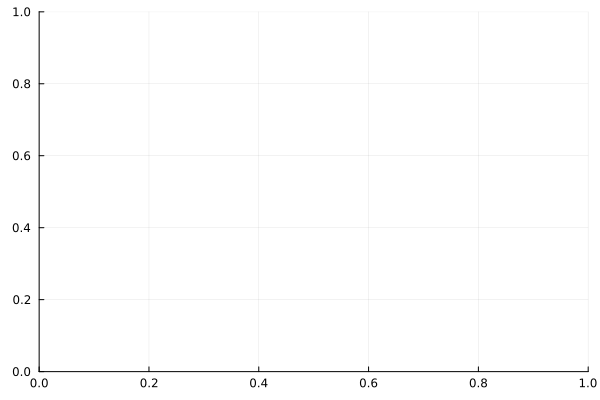

In [16]:
max_jump=0.5
class = 0
interp_sites = collect(5:40)
instance_idx = 2 # 4
invert_transform=false
@time begin 
stats, p1_ns = any_interpolate_single_timeseries(fc_sl, class, instance_idx, interp_sites, :directMedian; invert_transform=invert_transform, NN_baseline=true, X_train=X_train, y_train=y_train, n_baselines=1, plot_fits=true, dx=dx, mode_range=mode_range, xvals=xvals, mode_index=mode_index, xvals_enc=xvals_enc, xvals_enc_it=xvals_enc_it, max_jump=max_jump);
end

pretty_table(stats; header=["Metric", "Value"], header_crayon= crayon"yellow bold", tf = tf_unicode_rounded);
plot(p1_ns...)


  9.961527 seconds (41.30 M allocations: 8.096 GiB, 14.68% gc time, 0.30% compilation time)
╭────────┬───────────╮
│ Metric │     Value │
├────────┼───────────┤
│    MAE │ 0.0553178 │
│ NN_MAE │ 0.0584767 │
╰────────┴───────────╯


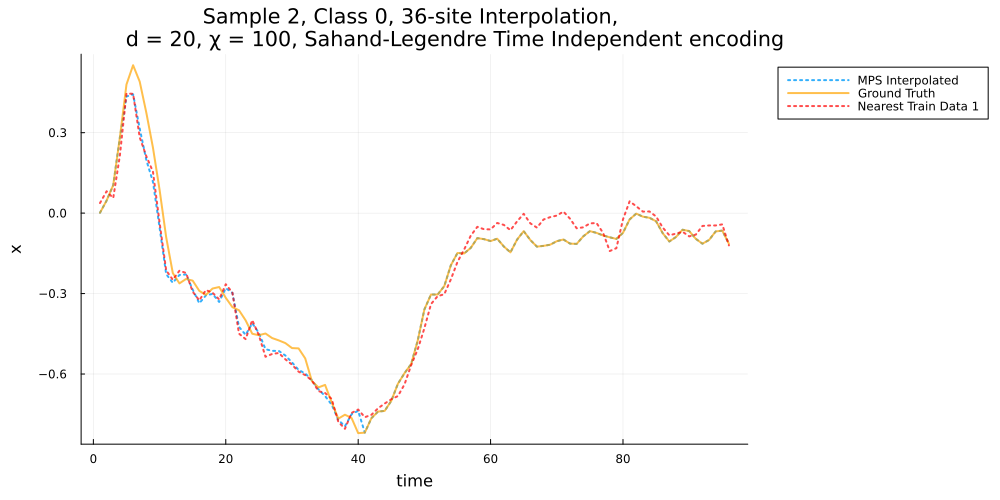

In [11]:
max_jump=0.5
class = 0
interp_sites = collect(5:40)
instance_idx = 2 # 4
invert_transform=false
@time begin 
stats, p1_ns = any_interpolate_single_timeseries(fc_sl, class, instance_idx, interp_sites, :directMedian; dx=dx, invert_transform=invert_transform, NN_baseline=true, X_train=X_train, y_train=y_train, n_baselines=1, plot_fits=true, mode_range=mode_range, xvals=xvals, mode_index=mode_index, xvals_enc=xvals_enc, xvals_enc_it=xvals_enc_it, max_jump=max_jump);
end

pretty_table(stats; header=["Metric", "Value"], header_crayon= crayon"yellow bold", tf = tf_unicode_rounded);
plot(p1_ns...)


In [5]:
mode_range=(-1,1)
xvals=collect(range(mode_range...; step=1E-4))
mode_index=Index(opts_sl.d)
xvals_enc= [get_state(x, opts_sl) for x in xvals]
xvals_enc_it=[ITensor(s, mode_index) for s in xvals_enc];

n1s = sum(y_test)
n0s = length(y_test) - n1s

samples = [1:n0s; 1:n1s]
interp_sites = collect(6:21)

classes = [zeros(Int,n0s); ones(Int,n1s)]
max_jump=1
mm_ps = []

mm_stats = []

for (i,s) in enumerate(samples)
    class = classes[i]
    instance_idx = s
    mm_stat, mm_p1 = any_interpolate_single_timeseries(fc_sl, class, instance_idx, interp_sites, :directMedian; NN_baseline=true, X_train=X_train, y_train=y_train, n_baselines=1, plot_fits=true, mode_range=mode_range, xvals=xvals, mode_index=mode_index, xvals_enc=xvals_enc, xvals_enc_it=xvals_enc_it, max_jump=max_jump);
    push!(mm_ps, mm_p1...)
    push!(mm_stats, mm_stat)


end

┌ Warning: Test set has a value more than 1% below lower bound after train normalization!
└ @ Main /home/noodles/Documents/QuantumInspiredML/QuantumInspiredML/Interpolation/ForecastingMainNew.jl:534
┌ Warning: Test set has a value more than 1% below lower bound after train normalization!
└ @ Main /home/noodles/Documents/QuantumInspiredML/QuantumInspiredML/Interpolation/ForecastingMainNew.jl:534


In [6]:
svpath = "ecg200/MeanMode_sl_d20chi100.jld2"
f = jldopen(svpath, "w")
    write(f, "stat", mm_stats)
    # write(f, "ps", ,mm_ps);
close(f)

In [8]:
stats_df = vcat(DataFrame.(mm_stats)...)
@show describe(stats_df);

describe(stats_df) = 2×7 DataFrame
 Row │ variable  mean      min       median    max      nmissing  eltype
     │ Symbol    Float64   Float64   Float64   Float64  Int64     DataType
─────┼─────────────────────────────────────────────────────────────────────
   1 │ MAE       0.464699  0.108641  0.32394   2.5737          0  Float64
   2 │ NN_MAE    0.348285  0.115119  0.281254  1.53579         0  Float64


In [96]:
n1s = sum(y_test)
n0s = length(y_test) - n1s

n_each = 6
samples = [shuffle(1:n0s)[1:n_each]; shuffle(1:n1s)[1:n_each]]
interp_sites = collect(2:50)

classes = [zeros(Int,n_each); ones(Int,n_each)]
max_jump=1
mm_ps = []
mode_ps = []
mm_stats = []
mode_stats = []
for (i,s) in enumerate(samples)
    class = classes[i]
    instance_idx = s
    mm_stat, mm_p1 = any_interpolate_single_timeseries(fc_sl, class, instance_idx, interp_sites, :MeanMode; NN_baseline=true, X_train=X_train, y_train=y_train, n_baselines=1, plot_fits=true, mode_range=mode_range, xvals=xvals, mode_index=mode_index, xvals_enc=xvals_enc, xvals_enc_it=xvals_enc_it, max_jump=max_jump);
    push!(mm_ps, mm_p1...)
    push!(mm_stats, mm_stat)

    mode_stat, mode_p1 = any_interpolate_single_timeseries(fc_sl, class, instance_idx, interp_sites, :MeanMode; NN_baseline=true, X_train=X_train, y_train=y_train, n_baselines=1, plot_fits=true, mode_range=mode_range, xvals=xvals, mode_index=mode_index, xvals_enc=xvals_enc, xvals_enc_it=xvals_enc_it, max_jump=max_jump);
    push!(mode_ps, mm_p1...)
    push!(mode_stats, mode_stat)
end

┌ Warning: Test set has a value more than 1% below lower bound after train normalization!
└ @ Main /home/noodles/Documents/QML Project/QuantumInspiredML/Interpolation/ForecastingMainNew.jl:534


In [97]:
stats

12-element Vector{Any}:
 Dict(:MAE => 0.11568090836508868, :NN_MAE => 0.10159072681704871)
 Dict(:MAE => 0.1326617615202875, :NN_MAE => 0.12379699797424894)
 Dict(:MAE => 0.570918584584176, :NN_MAE => 0.23046135560726316)
 Dict(:MAE => 0.06635023554459585, :NN_MAE => 0.07015005215709803)
 Dict(:MAE => 0.1978363986573367, :NN_MAE => 0.10273551278092394)
 Dict(:MAE => 0.5782991548579288, :NN_MAE => 0.22613743417136214)
 Dict(:MAE => 0.07480557991541885, :NN_MAE => 0.10740802828662395)
 Dict(:MAE => 0.1013784669465359, :NN_MAE => 0.0751538003757013)
 Dict(:MAE => 0.06335841453033791, :NN_MAE => 0.07804884015649663)
 Dict(:MAE => 0.1879406060335338, :NN_MAE => 0.0864246639260381)
 Dict(:MAE => 0.10371409415178769, :NN_MAE => 0.05317545424134927)
 Dict(:MAE => 0.12347399031960486, :NN_MAE => 0.04409607618891691)

12-element Vector{Any}:
 Dict(:MAE => 0.4568977767835106, :NN_MAE => 0.3018593504468085)
 Dict(:MAE => 0.2012856725393617, :NN_MAE => 0.1800278137446809)
 Dict(:MAE => 0.46093369793244676, :NN_MAE => 0.4635632465106383)
 Dict(:MAE => 0.891631304, :NN_MAE => 0.7359272351297874)
 Dict(:MAE => 0.4907636235968083, :NN_MAE => 0.3671056525829786)
 Dict(:MAE => 1.1539957381186166, :NN_MAE => 0.5429127471553193)
 Dict(:MAE => 0.39683449913404273, :NN_MAE => 0.30536013063829787)
 Dict(:MAE => 0.19541268490957445, :NN_MAE => 0.16183973623404257)
 Dict(:MAE => 0.8565658865723401, :NN_MAE => 0.36863219158085103)
 Dict(:MAE => 0.5215698408930854, :NN_MAE => 0.24540259927659575)
 Dict(:MAE => 0.2403342307893617, :NN_MAE => 0.24570440476595745)
 Dict(:MAE => 0.28986350995372345, :NN_MAE => 0.32259829904255316)

In [37]:
stats_df = vcat(DataFrame.(stats)...)
@show describe(stats_df);


describe(stats_df) = 2×7 DataFrame
 Row │ variable  mean      min       median    max       nmissing  eltype
     │ Symbol    Float64   Float64   Float64   Float64   Int64     DataType
─────┼──────────────────────────────────────────────────────────────────────
   1 │ MAE       0.501016  0.195413  0.458916  1.14355          0  Float64
   2 │ NN_MAE    0.353411  0.16184   0.313979  0.735927         0  Float64


In [52]:
stats_df = vcat(DataFrame.(stats)...)
@show describe(stats_df);


describe(stats_df) = 2×7 DataFrame
 Row │ variable  mean      min       median    max       nmissing  eltype
     │ Symbol    Float64   Float64   Float64   Float64   Int64     DataType
─────┼──────────────────────────────────────────────────────────────────────
   1 │ MAE       0.470413  0.174703  0.436476  0.950815         0  Float64
   2 │ NN_MAE    0.355467  0.150286  0.305719  0.801248         0  Float64


In [47]:
stats_df = vcat(DataFrame.(stats)...)
@show describe(stats_df);


describe(stats_df) = 2×7 DataFrame
 Row │ variable  mean      min       median    max       nmissing  eltype
     │ Symbol    Float64   Float64   Float64   Float64   Int64     DataType
─────┼──────────────────────────────────────────────────────────────────────
   1 │ MAE       0.551527  0.283882  0.543227  0.921432         0  Float64
   2 │ NN_MAE    0.421204  0.196812  0.385045  0.67573          0  Float64


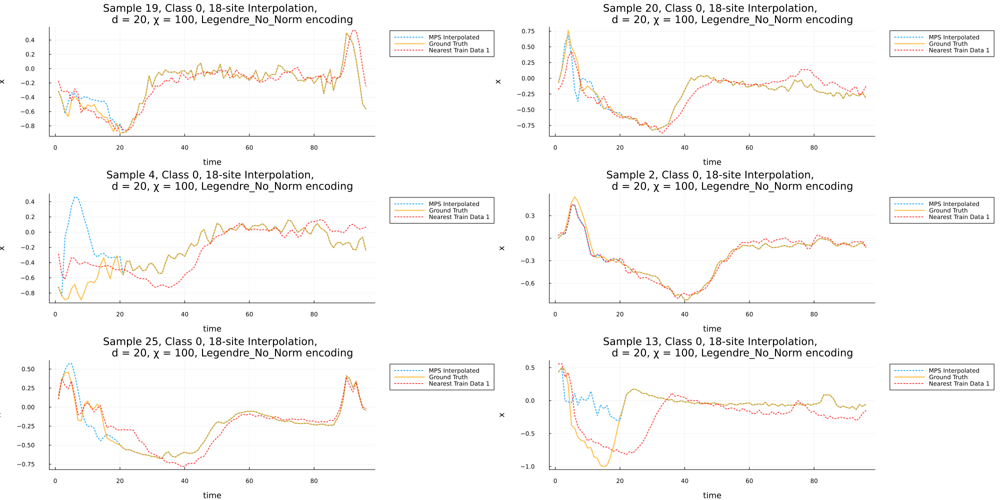

In [98]:
p1 = plot(ps[1:6]..., size=(2000,1000), layout=(3,2))
# savefig(p1, "figs/c0ecg.svg")

p2 = plot(ps[7:12]..., size=(2000,1000), layout=(3,2))
# savefig(p2, "figs/c1ecg.svg")
p1


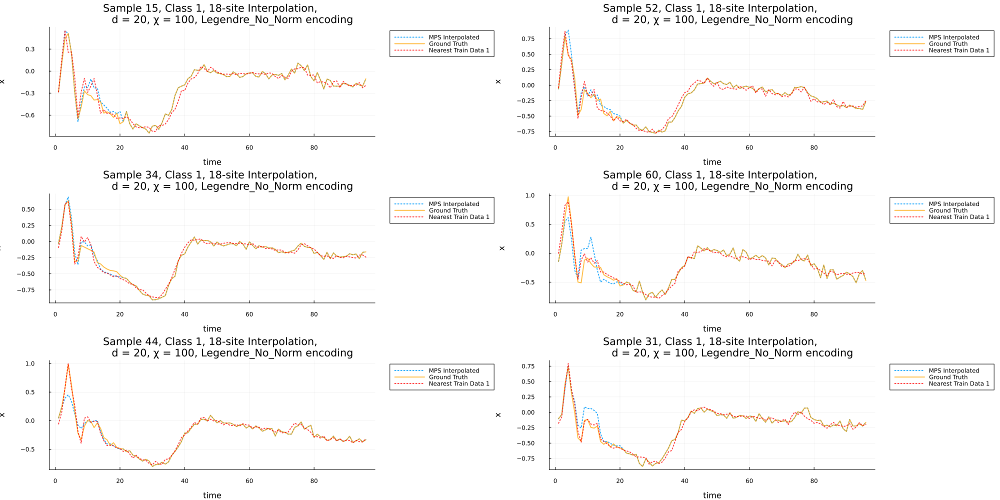

In [99]:
p2

In [8]:


mode_range=(-1,1)
xvals=collect(range(mode_range...; step=1E-4))
mode_index=Index(opts_ns.d)
xvals_enc= [get_state(x, opts_ns) for x in xvals]
xvals_enc_it=[ITensor(s, mode_index) for s in xvals_enc];

n1s = sum(y_test)
n0s = length(y_test) - n1s

samples = [1:n0s; 1:n1s]
interp_sites = collect(5:40)

classes = [zeros(Int,n0s); ones(Int,n1s)]
max_jump=1
mm_ps = []
mode_ps = []
mm_stats = []
mode_stats = []
for (i,s) in enumerate(samples)
    class = classes[i]
    instance_idx = s
    mm_stat, mm_p1 = any_interpolate_single_timeseries(fc_sl, class, instance_idx, interp_sites, :MeanMode; NN_baseline=true, X_train=X_train, y_train=y_train, n_baselines=1, plot_fits=true, mode_range=mode_range, xvals=xvals, mode_index=mode_index, xvals_enc=xvals_enc, xvals_enc_it=xvals_enc_it, max_jump=max_jump);
    push!(mm_ps, mm_p1...)
    push!(mm_stats, mm_stat)

    mode_stat, mode_p1 = any_interpolate_single_timeseries(fc_sl, class, instance_idx, interp_sites, :directMode; NN_baseline=true, X_train=X_train, y_train=y_train, n_baselines=1, plot_fits=true, mode_range=mode_range, xvals=xvals, mode_index=mode_index, xvals_enc=xvals_enc, xvals_enc_it=xvals_enc_it, max_jump=max_jump);
    push!(mode_ps, mode_p1...)
    push!(mode_stats, mode_stat)
end

┌ Warning: Test set has a value more than 1% below lower bound after train normalization!
└ @ Main /home/noodles/Documents/QML Project/QuantumInspiredML/Interpolation/ForecastingMainNew.jl:534
┌ Warning: Test set has a value more than 1% below lower bound after train normalization!
└ @ Main /home/noodles/Documents/QML Project/QuantumInspiredML/Interpolation/ForecastingMainNew.jl:534
┌ Warning: Test set has a value more than 1% below lower bound after train normalization!
└ @ Main /home/noodles/Documents/QML Project/QuantumInspiredML/Interpolation/ForecastingMainNew.jl:534
┌ Warning: Test set has a value more than 1% below lower bound after train normalization!
└ @ Main /home/noodles/Documents/QML Project/QuantumInspiredML/Interpolation/ForecastingMainNew.jl:534


In [13]:
svpath = "../../FinalBenchmarks/Interpolation/ECG200/MeanMode_sl_d20chi100.jld2"
f = jldopen(svpath, "w")
    write(f, "fc", fc_sl)
    write(f, "stat", mm_stats)
    write(f, "ps", mm_ps);
close(f)

svpath = "../../FinalBenchmarks/Interpolation/ECG200/Mode_sl_d20chi100.jld2"
f = jldopen(svpath, "w")
    write(f, "fc", fc_sl)
    write(f, "stat", mode_stats)
    write(f, "ps", mode_ps);
close(f)

In [27]:
argmax(stats_df[!, :MAE])

24

In [56]:
df_mode = vcat(DataFrame.(mode_stats)...)
@show describe(df_mode) ;

println()
df_mm = vcat(DataFrame.(mm_stats)...)
@show describe(df_mm);

describe(df_mode) = 2×7 DataFrame
 Row │ variable  mean      min       median    max      nmissing  eltype
     │ Symbol    Float64   Float64   Float64   Float64  Int64     DataType
─────┼─────────────────────────────────────────────────────────────────────
   1 │ MAE       0.49899   0.144864  0.367886  2.0618          0  Float64
   2 │ NN_MAE    0.359787  0.11118   0.273551  1.60413         0  Float64

describe(df_mm) = 2×7 DataFrame
 Row │ variable  mean      min       median    max      nmissing  eltype
     │ Symbol    Float64   Float64   Float64   Float64  Int64     DataType
─────┼─────────────────────────────────────────────────────────────────────
   1 │ MAE       0.482691  0.144864  0.354442  2.01439         0  Float64
   2 │ NN_MAE    0.359787  0.11118   0.273551  1.60413         0  Float64


In [58]:
nbins=10
histogram(df_mm[!, :NN_MAE], label="Nearest Neighbour MAE", colour=:red, bins=nbins)

h1 = histogram!(df_mode[!, :MAE], label="Mode MAE", colour=:blue, alpha=0.5, bins=nbins)
histogram(df_mm[!, :NN_MAE], label="Nearest Neighbour MAE", colour=:red, bins=nbins)

h2 = histogram!(df_mm[!, :MAE], label="Mean/Mode MAE", colour=:blue, alpha=0.5, bins=nbins)

p = plot([h1, h2]..., size=(1000,500), title="ECG200 Interpolation")
# savefig(p, "figs/hists.svg")

"/home/noodles/Documents/QML Project/QuantumInspiredML/Interpolation/Interp_benchmarks/figs/hists.svg"

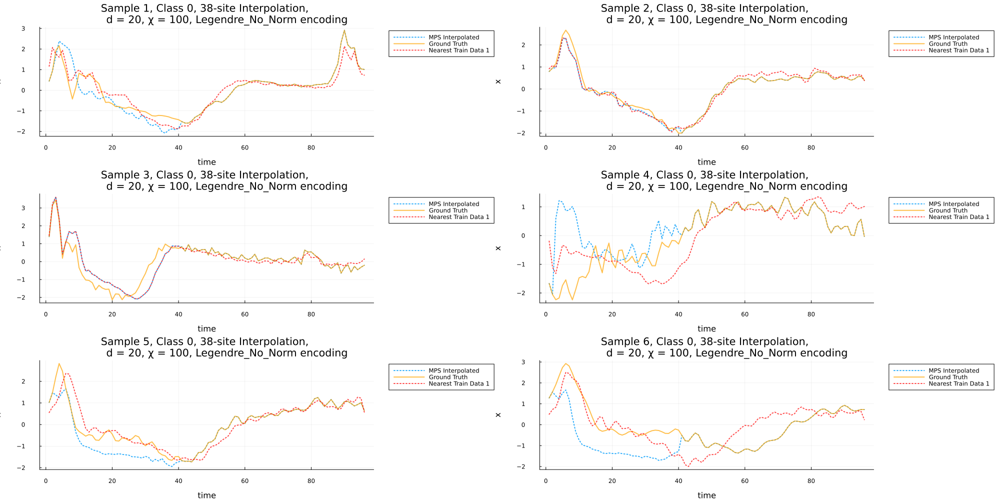

In [61]:
p1a = plot(mm_ps[5:24]..., size=(2000,1000), layout=(5,4))
savefig(p1a, "figs/mm_c0ecg_large.svg")
p1 = plot(mm_ps[1:6]..., size=(2000,1000), layout=(3,2))
savefig(p1, "figs/mm_c0ecg_small.svg")

p2a = plot(mode_ps[5:24]..., size=(2000,1000), layout=(5,4))
savefig(p2a, "figs/mode_c0ecg_large.svg")
p2 = plot(mode_ps[1:6]..., size=(2000,1000), layout=(3,2))
savefig(p2, "figs/mode_c0ecg_small.svg")
# savefig(p2, "figs/c1ecg.svg")
p1


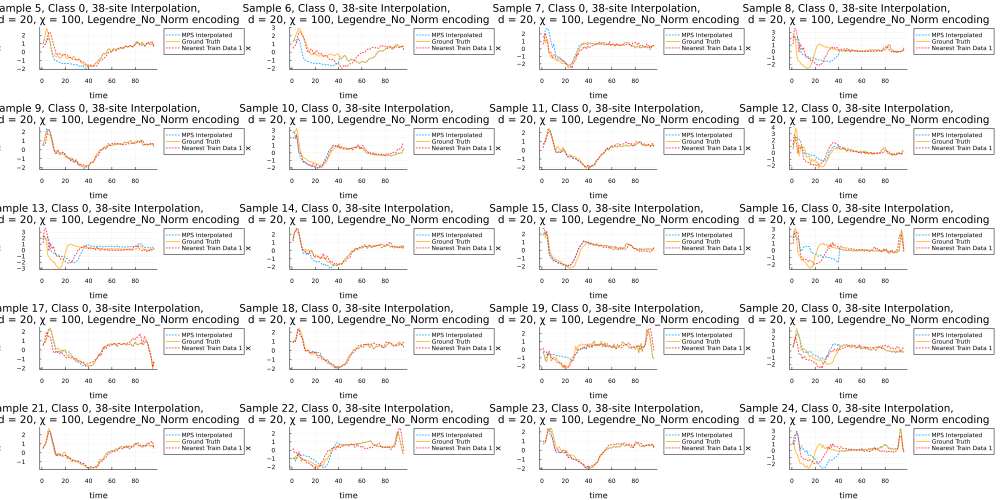

In [32]:
p2

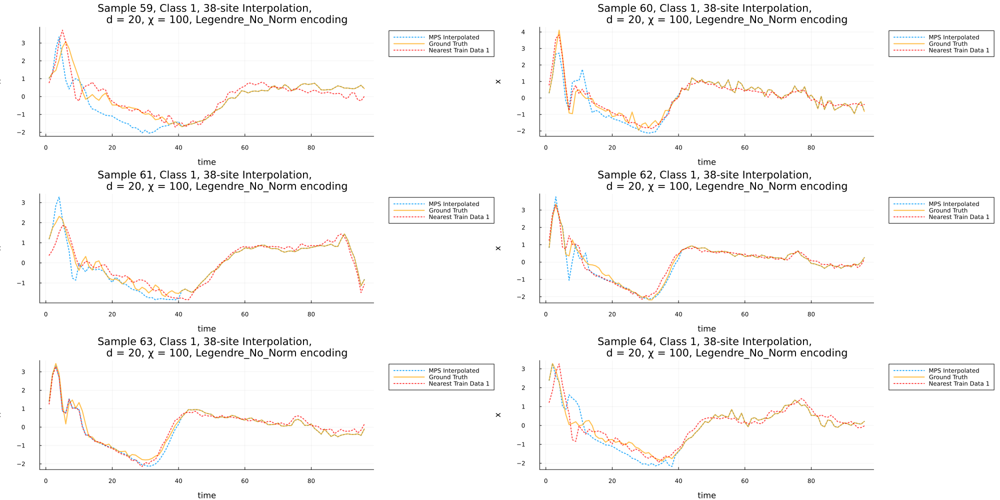

In [62]:
p1 = plot(mm_ps[end-19:end]..., size=(2000,1000), layout=(5,4))
savefig(p1, "figs/mm_c1ecg_large.svg")
p1 = plot(mm_ps[end-5:end]..., size=(2000,1000), layout=(3,2))
savefig(p1, "figs/mm_c1ecg_small.svg")

p2a = plot(mode_ps[end-19:end]..., size=(2000,1000), layout=(5,4))
savefig(p2a, "figs/mode_c1ecg_large.svg")
p2 = plot(mode_ps[end-5:end]..., size=(2000,1000), layout=(3,2))
savefig(p2a, "figs/mode_c1ecg_small.svg")
p1


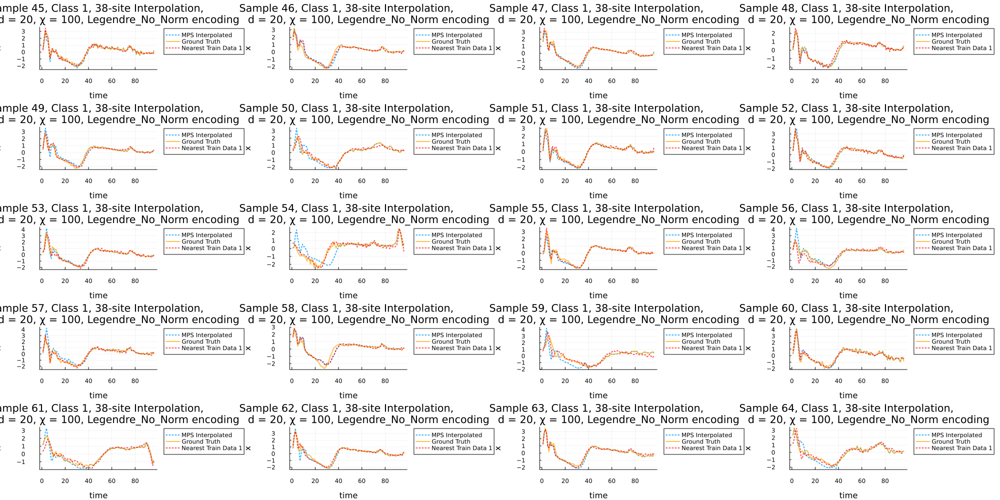

In [26]:
p2

# ItalyPower

In [3]:
svpath = "../../Data/italypower/mps_saves/sahand_legendre__ns_d12_chi60.jld2"

dloc =  "../../Data/italypower/datasets/ItalyPowerDemandOrig.jld2"
f = jldopen(dloc, "r")
    X_train = read(f, "X_train")
    y_train = read(f, "y_train")
    X_test = read(f, "X_test")
    y_test = read(f, "y_test")
close(f)

f = jldopen(svpath, "r")
    mps = read(f, "mps")
    opts = read(f, "opts")
close(f)
opts, _... = safe_options(opts, nothing, nothing)

fc_ipd = load_forecasting_info_variables(mps, X_train, y_train, X_test, y_test, opts);

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
                         Summary:

 - Dataset has 67 training samples and 1029 testing samples.
 - 2 class(es) was detected. Slicing MPS into individual states...
 - Time independent encoding - Sahand-Legendre Time Independent - detected.
 - d = 12, chi_max = 60
Re-encoding the training data to get the encoding arguments...

 Created 2 forecastable struct(s) containing class-wise mps and test samples.


In [9]:
include("../ForecastingMainNew.jl");


In [10]:
mode_range=(-1,1)
xvals=collect(range(mode_range...; step=1E-4))
mode_index=Index(opts.d)
xvals_enc= [get_state(x, opts, fc_ipd[1].enc_args) for x in xvals]
xvals_enc_it=[ITensor(s, mode_index) for s in xvals_enc];

# n1s = sum(y_test)
# n0s = length(y_test) - n1s

n0s = 100
n1s = 100
samples = [1:n0s; 1:n1s]
interp_sites = collect(5:24)

classes = [zeros(Int,n0s); ones(Int,n1s)]
max_jump=1
ipd_med_ps = []
ipd_mode_ps = []
ipd_med_stats = []
ipd_mode_stats = []
for (i,s) in enumerate(samples)
    class = classes[i]
    instance_idx = s
    # med_stat, med_p1 = any_interpolate_single_timeseries(fc_ipd, class, instance_idx, interp_sites, :directMedian; NN_baseline=true, X_train=X_train, y_train=y_train, n_baselines=1, plot_fits=true, mode_range=mode_range, xvals=xvals, mode_index=mode_index, xvals_enc=xvals_enc, xvals_enc_it=xvals_enc_it, max_jump=max_jump);
    # push!(ipd_med_ps, med_p1...)
    # push!(ipd_med_stats, med_stat)

    mode_stat, mode_p1 = any_interpolate_single_timeseries(fc_ipd, class, instance_idx, interp_sites, :directMode; NN_baseline=true, X_train=X_train, y_train=y_train, n_baselines=1, plot_fits=true, mode_range=mode_range, xvals=xvals, mode_index=mode_index, xvals_enc=xvals_enc, xvals_enc_it=xvals_enc_it, max_jump=max_jump);
    push!(ipd_mode_ps, mode_p1...)
    push!(ipd_mode_stats, mode_stat)
end

┌ Warning: Test set has a value more than 1% above upper bound after train normalization!
└ @ Main /home/noodles/Documents/QML Project/QuantumInspiredML/Interpolation/ForecastingMainNew.jl:777
┌ Warning: Test set has a value more than 1% below lower bound after train normalization!
└ @ Main /home/noodles/Documents/QML Project/QuantumInspiredML/Interpolation/ForecastingMainNew.jl:769
┌ Warning: Test set has a value more than 1% above upper bound after train normalization!
└ @ Main /home/noodles/Documents/QML Project/QuantumInspiredML/Interpolation/ForecastingMainNew.jl:777
┌ Warning: Test set has a value more than 1% above upper bound after train normalization!
└ @ Main /home/noodles/Documents/QML Project/QuantumInspiredML/Interpolation/ForecastingMainNew.jl:777
┌ Warning: Test set has a value more than 1% above upper bound after train normalization!
└ @ Main /home/noodles/Documents/QML Project/QuantumInspiredML/Interpolation/ForecastingMainNew.jl:777


In [11]:
# svpath = "../../FinalBenchmarks/Interpolation/ItalyPower/LSmed_sl_d16chi80.jld2"
# f = jldopen(svpath, "w")
#     write(f, "fc", fc_ipd)
#     write(f, "stat", ipd_mm_stats)
#     write(f, "ps", ipd_mm_ps);
# close(f)

svpath = "../../FinalBenchmarks/Interpolation/ItalyPower/LSmode_sl_d16chi80.jld2"
f = jldopen(svpath, "w")
    write(f, "fc", fc_ipd)
    write(f, "stat", ipd_mode_stats)
    write(f, "ps", ipd_mode_ps);
close(f)

In [13]:
svpath = "../../FinalBenchmarks/Interpolation/ItalyPower/Mode_GD_d16chi80.jld2"


KeyError: KeyError: key "stat" not found

In [15]:
# df_mode = vcat(DataFrame.(norm_mode_stats)...)
# @show describe(df_mode) ;

# println()
df_ls_mode = vcat(DataFrame.(ipd_mode_stats)...)
@show describe(df_ls_mode);

describe(df_ls_mode) = 2×7 DataFrame
 Row │ variable  mean      min        median    max       nmissing  eltype
     │ Symbol    Float64   Float64    Float64   Float64   Int64     DataType
─────┼───────────────────────────────────────────────────────────────────────
   1 │ MAE       0.209031  0.0526515  0.152567  0.919407         0  Float64
   2 │ NN_MAE    0.228281  0.0628499  0.193322  0.888347         0  Float64


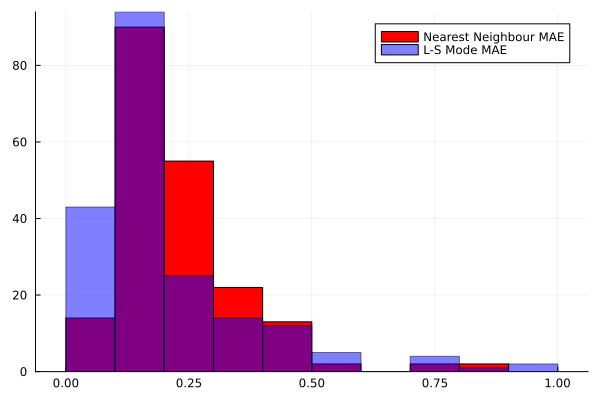

In [16]:
nbins=10

histogram(df_ls_mode[!, :NN_MAE], label="Nearest Neighbour MAE", colour=:red, bins=nbins)

h2 = histogram!(df_ls_mode[!, :MAE], label="L-S Mode MAE", colour=:blue, alpha=0.5, bins=nbins)



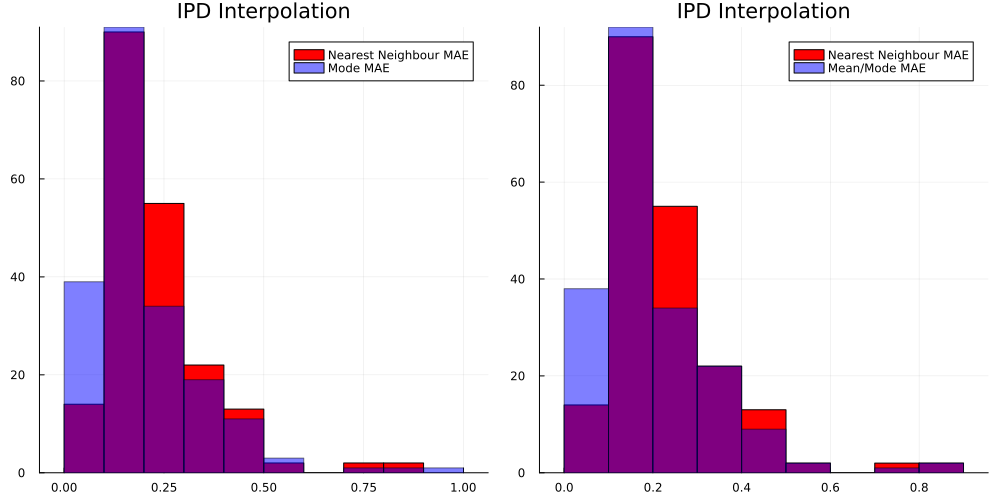

In [71]:
nbins=10
histogram(df_mm[!, :NN_MAE], label="Nearest Neighbour MAE", colour=:red, bins=nbins)

h1 = histogram!(df_mode[!, :MAE], label="Mode MAE", colour=:blue, alpha=0.5, bins=nbins)
histogram(df_mm[!, :NN_MAE], label="Nearest Neighbour MAE", colour=:red, bins=nbins)

h2 = histogram!(df_mm[!, :MAE], label="Mean/Mode MAE", colour=:blue, alpha=0.5, bins=nbins)

p = plot([h1, h2]..., size=(1000,500), title="IPD Interpolation")
# savefig(p, "figs/ipdhists.svg")

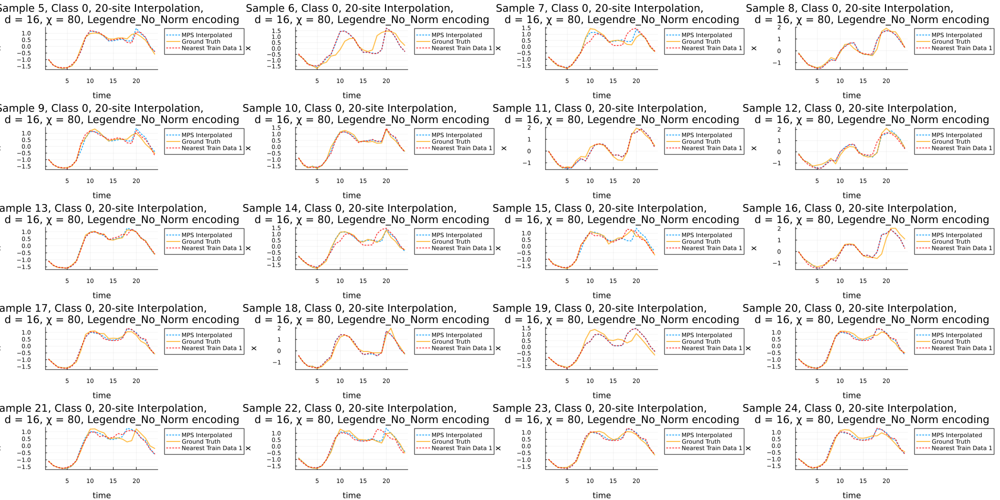

In [74]:
p1a = plot(ipd_mm_ps[5:24]..., size=(2000,1000), layout=(5,4))
savefig(p1a, "figs/mm_c0ipd_large.svg")
p1 = plot(ipd_mm_ps[1:6]..., size=(2000,1000), layout=(3,2))
savefig(p1, "figs/mm_c0ipd_small.svg")

p2a = plot(ipd_mode_ps[5:24]..., size=(2000,1000), layout=(5,4))
savefig(p2a, "figs/mode_c0ipd_large.svg")
p2 = plot(ipd_mode_ps[1:6]..., size=(2000,1000), layout=(3,2))
savefig(p2, "figs/mode_c0ipd_small.svg")
# savefig(p2, "figs/c1ecg.svg")
p1a